In [1]:
import numpy as np 
import pandas as pd 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import seaborn as sns

from sklearn.metrics import precision_score, recall_score, ConfusionMatrixDisplay,confusion_matrix, classification_report,accuracy_score, f1_score
import random
import seaborn as sns

from sklearn.metrics import classification_report,confusion_matrix

from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, Flatten, Dense, GlobalMaxPooling2D, AveragePooling2D, GlobalAveragePooling2D,Dropout
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping


from tensorflow.keras.models import Sequential
import warnings
warnings.filterwarnings("ignore")
from PIL import Image

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
IMG_SHAPE = (250,250)
IMG_SHAPE_GN = (250,250,3)

**Reading the data from .txt**

In [5]:
#reading csv
df = pd.read_csv('../input/cats-and-dogs-breeds-classification-oxford-dataset/annotations/annotations/list.txt')

#The first 4 rows consists of the information about breeds
info = df.head(4).copy()


In [6]:
#Reading the data after 5th row
df = df.loc[5:,]

#Processing the columns
df[['CLASS-ID','SPECIES','BREED','ID']] = df['#Image CLASS-ID SPECIES BREED ID'].str.split(expand=True) 

#Dropping unnecessary columns
df = df.drop('#Image CLASS-ID SPECIES BREED ID',axis=1)

#renaming the columns
df = df.rename(columns={"CLASS-ID": "image", "SPECIES": "CLASS-ID", 'BREED' : "SPECIES", "ID":"BREED ID"})


#converting the object type to int type
df[["CLASS-ID","SPECIES","BREED ID"]] = df[["CLASS-ID","SPECIES","BREED ID"]].astype(int)

In [7]:
df

,image,CLASS-ID,SPECIES,BREED ID
5,Abyssinian_100,1,1,1
6,Abyssinian_101,1,1,1
7,Abyssinian_102,1,1,1
8,Abyssinian_103,1,1,1
9,Abyssinian_104,1,1,1
...,...,...,...,...
7349,yorkshire_terrier_96,37,2,25
7350,yorkshire_terrier_97,37,2,25
7351,yorkshire_terrier_98,37,2,25
7352,yorkshire_terrier_99,37,2,25


In [8]:
df['image'] = df['image'].apply(lambda x : str(x)+'.jpg')
df = df.reset_index()
df = df.drop('index',axis=1)

In [9]:
df

,image,CLASS-ID,SPECIES,BREED ID
0,Abyssinian_100.jpg,1,1,1
1,Abyssinian_101.jpg,1,1,1
2,Abyssinian_102.jpg,1,1,1
3,Abyssinian_103.jpg,1,1,1
4,Abyssinian_104.jpg,1,1,1
...,...,...,...,...
7344,yorkshire_terrier_96.jpg,37,2,25
7345,yorkshire_terrier_97.jpg,37,2,25
7346,yorkshire_terrier_98.jpg,37,2,25
7347,yorkshire_terrier_99.jpg,37,2,25


In [10]:
#Extracting the classname/breed of the animal
df['classname'] = df['image'].apply(lambda x: str(x)[0:str(x).index('_')])
df.head()

,image,CLASS-ID,SPECIES,BREED ID,classname
0,Abyssinian_100.jpg,1,1,1,Abyssinian
1,Abyssinian_101.jpg,1,1,1,Abyssinian
2,Abyssinian_102.jpg,1,1,1,Abyssinian
3,Abyssinian_103.jpg,1,1,1,Abyssinian
4,Abyssinian_104.jpg,1,1,1,Abyssinian


**Visualizing the bar plot for all the species**

In [11]:
def breed_count(df, title):
    breed_count  = df['classname'].value_counts()

    plt.figure(figsize=(20,5))
    sns.barplot(x=breed_count.index, y=breed_count.values, alpha=0.8)
    plt.title('Value count of number of ' + title)
    plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel('Breed Names', fontsize=10)
    plt.xticks(rotation=90)
    plt.show()
    

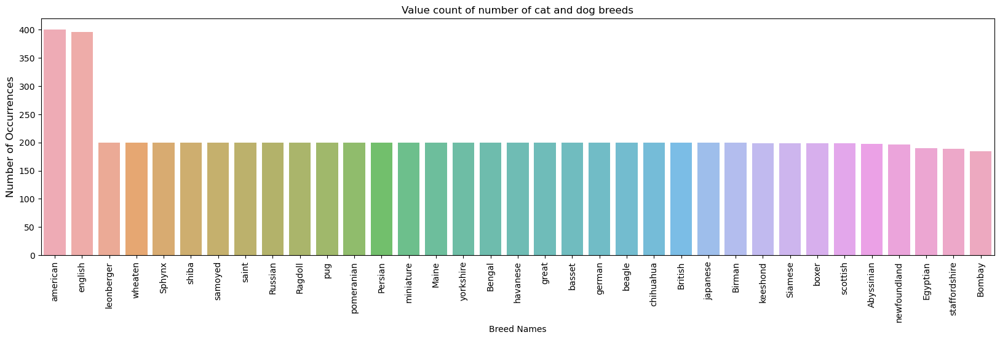

In [12]:
breed_count(df, "cat and dog breeds")

**Seperating dog and cat species**

In [13]:
df_cat = df[df['SPECIES']==1] #cat : 1
df_dog = df[df['SPECIES']==2] #dog : 2

In [14]:
print("Number of samples in df_cat ",df_cat.shape[0])
print("Number of samples in df_dog ",df_dog.shape[0])

Number of samples in df_cat  2371
Number of samples in df_dog  4978


**Cat species**

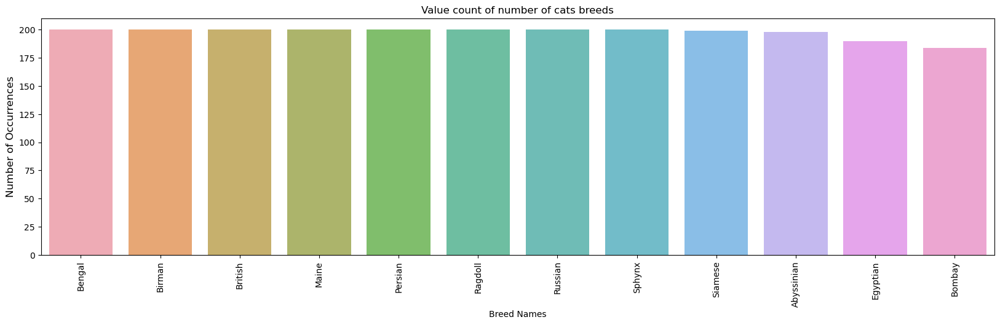

In [15]:
breed_count(df_cat, "cats breeds")

**Dog species**

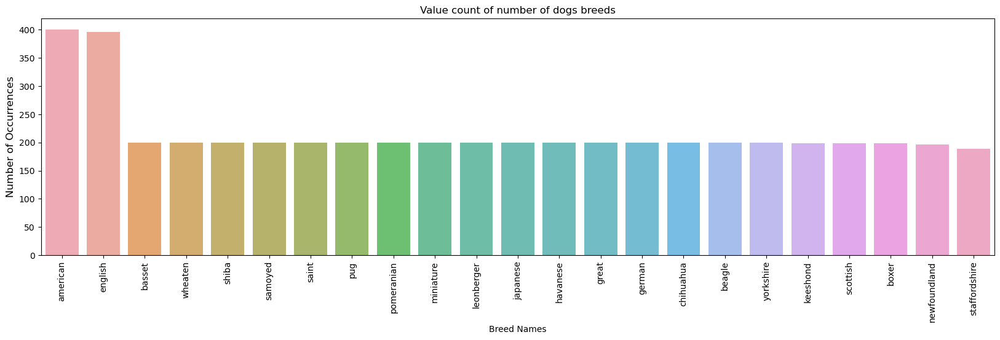

In [16]:
breed_count(df_dog, "dogs breeds")

In [17]:
# Process image (input) for the model
def process(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (250,250))
    img = tf.keras.applications.mobilenet.preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    return img

# Read image
def get_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image
    


**Visualize samples**

In [18]:
def visualize_samples(datagen, row_col_len=4, figsize=None):
    random_indexes = np.random.randint(0, len(datagen.labels), row_col_len**2)
    
    classes = np.array(list(datagen.class_indices))
    labels = classes[np.array(datagen.labels)[random_indexes]]
    filepaths = pd.Series(datagen.filenames)[random_indexes]
    filepaths = "../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images/" + filepaths

    images = filepaths.apply(get_image).reset_index(drop=True)
    figsize = figsize or np.array((row_col_len, row_col_len)) * 4
    fig, ax = plt.subplots(row_col_len, row_col_len, figsize=figsize)
    for i in range(row_col_len):
        for j in range(row_col_len):
            sample_index = i * row_col_len + j
            ax[i,j].imshow(images[sample_index])
            ax[i,j].set_title(labels[sample_index])
            ax[i,j].set_axis_off()
    plt.show()

**Visualizing the classification**

In [19]:
# Make classifications & visualize results
def visualize_classifications(model, datagen, row_col_len=4, figsize=None):
    random_indexes = np.random.randint(0, len(datagen.labels), row_col_len**2)
    
    classes = np.array(list(datagen.class_indices))
    labels = classes[np.array(datagen.labels)[random_indexes]]
    filepaths = pd.Series(datagen.filenames)[random_indexes]
    filepaths = "../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images/" + filepaths
#     print(filepaths[0])
    images = filepaths.apply(get_image).reset_index(drop=True)
    processed_images = np.vstack(images.apply(process).to_numpy()[:])
    
    y_pred = classes[np.argmax(model.predict(processed_images, verbose=0), axis=1)]
    y_true = labels
    
    figsize = figsize or np.array((row_col_len, row_col_len)) * 4
    fig, ax = plt.subplots(row_col_len, row_col_len, figsize=figsize)
    
    for i in range(row_col_len):
        for j in range(row_col_len):
            sample_index = i * row_col_len + j
            ax[i,j].imshow(images[sample_index])
            ax[i,j].set_title(f"Y true({y_true[sample_index]}) | Y pred ({y_pred[sample_index]})")
            ax[i,j].set_axis_off()
    plt.show()


**Data Augmentation**

In [20]:
train_datagen = ImageDataGenerator(    
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    validation_split=0.2,
                                    rotation_range=90,
                                    width_shift_range=0.2, 
                                   height_shift_range=0.2
                                  )


validation_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.2)

In [21]:
def datagen_flow_dataframe(df,train_datagen,validation_datagen):
    
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df,
        directory='../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images',
        x_col="image",
        y_col='classname',
        target_size=IMG_SHAPE,
        batch_size=128,
        class_mode="categorical",
        subset='training'
)

    valid_gen_flow = validation_datagen.flow_from_dataframe(
            dataframe=df,
            directory='../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images',
            x_col='image',
            y_col='classname',
            target_size=IMG_SHAPE,
            batch_size=128,
            class_mode="categorical",
            subset='validation', shuffle=False)
    
    return train_gen_flow, valid_gen_flow

**Cat generator**

In [22]:
train_gen_flow_cat, valid_gen_flow_cat = datagen_flow_dataframe(df_cat,train_datagen,validation_datagen)

Found 1897 validated image filenames belonging to 12 classes.
Found 474 validated image filenames belonging to 12 classes.


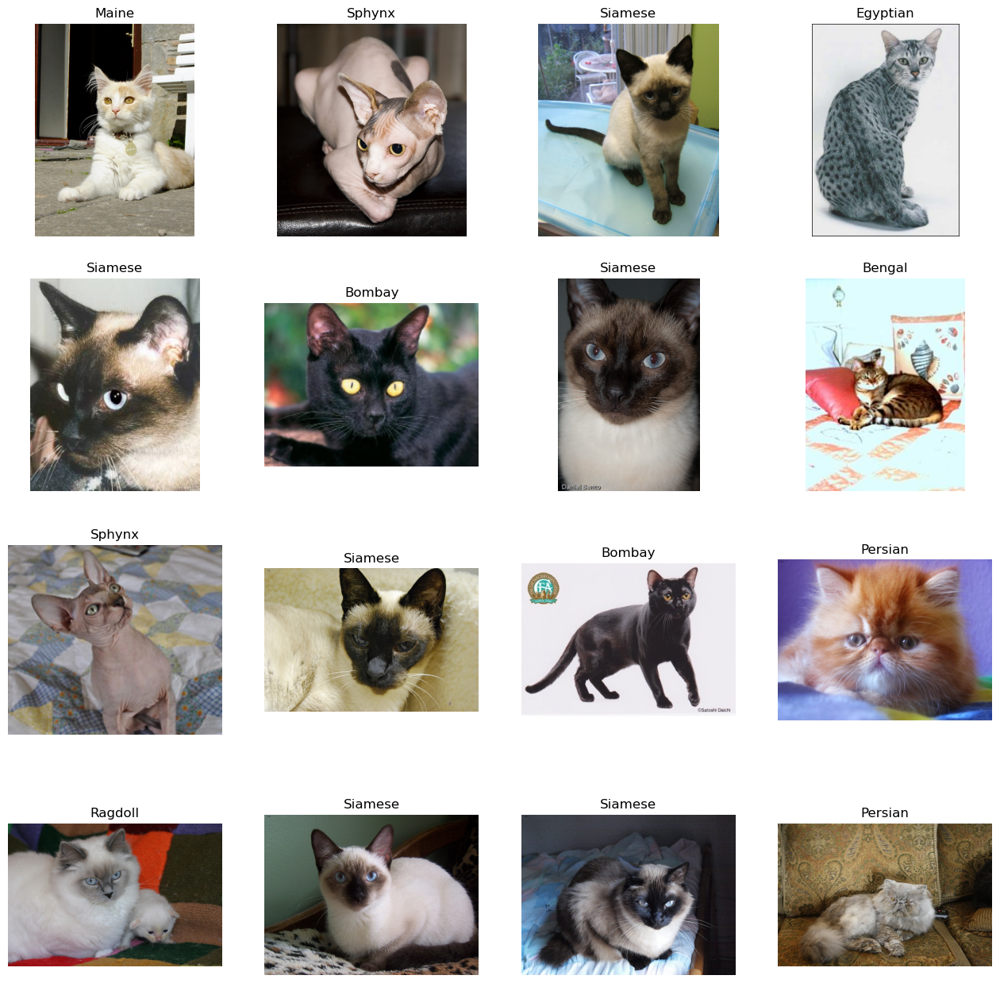

In [23]:
visualize_samples(train_gen_flow_cat)

**Dog generator**

In [24]:
train_gen_flow_dog, valid_gen_flow_dog = datagen_flow_dataframe(df_dog,train_datagen,validation_datagen)

Found 3983 validated image filenames belonging to 23 classes.
Found 995 validated image filenames belonging to 23 classes.


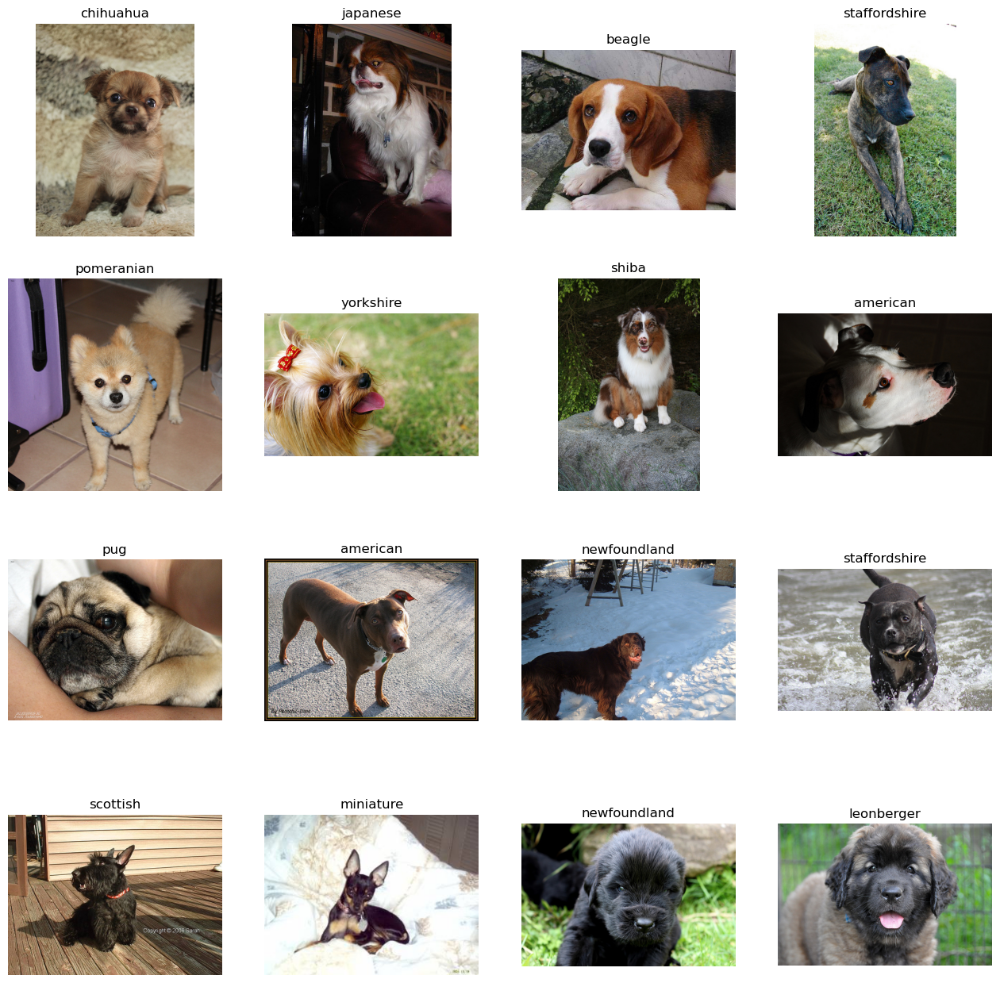

In [25]:
visualize_samples(train_gen_flow_dog)

**Model Training**

In [26]:
def train_model(model, train_generator, validation_generator, epochs, name):
    
    path_cp = name + '_weights.hdf5'
    rlr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 4, verbose = 1, 
                                min_delta = 1e-4, min_lr = 1e-4, mode = 'min', cooldown=1)
    
    ckp = ModelCheckpoint(path_cp,monitor = 'val_loss',
                      verbose = 1, save_best_only = True, mode = 'min')
    
    es = EarlyStopping(monitor = 'val_loss', min_delta = 1e-4, patience = 7,mode = 'min', restore_best_weights = True, verbose = 1)
  
    # Fitting the model
    history = model.fit(train_generator,
                      epochs = epochs, 
                      validation_data = validation_generator, 
                      verbose = 1,
                      callbacks = [rlr,es,ckp])
    return history

**Cat model classifier**

In [27]:
pretrainedModel_cat = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE_GN,
     include_top=False,
     weights='imagenet',
     pooling='avg'
)
pretrainedModel_cat.trainable = False

inputs = pretrainedModel_cat.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrainedModel_cat.output)
x = tf.keras.layers.Dense(64, activation='relu')(x)

outputs = tf.keras.layers.Dense(12, activation='softmax')(x)

model_1 = tf.keras.Model(inputs=inputs, outputs=outputs)
model_1.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(learning_rate=0.01), metrics=['acc'])

model_1.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                               

In [ ]:
train_history = train_model(model_1, train_gen_flow_cat, valid_gen_flow_cat, epochs = 50,name="cat")
#test data
model_1.evaluate(valid_gen_flow_cat)

Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 2.7365 - acc: 0.3158
Epoch 1: val_loss improved from inf to 1.52787, saving model to cat_weights.hdf5
15/15 [==============================] - 50s 3s/step - loss: 2.7365 - acc: 0.3158 - val_loss: 1.5279 - val_acc: 0.4283 - lr: 0.0100
Epoch 2/50
15/15 [==============================] - ETA: 0s - loss: 1.0219 - acc: 0.6389
Epoch 2: val_loss improved from 1.52787 to 0.72479, saving model to cat_weights.hdf5
15/15 [==============================] - 33s 2s/step - loss: 1.0219 - acc: 0.6389 - val_loss: 0.7248 - val_acc: 0.7363 - lr: 0.0100
Epoch 3/50
15/15 [==============================] - ETA: 0s - loss: 0.6990 - acc: 0.7522
Epoch 3: val_loss improved from 0.72479 to 0.53691, saving model to cat_weights.hdf5
15/15 [==============================] - 33s 2s/step - loss: 0.6990 - acc: 0.7522 - val_loss: 0.5369 - val_acc: 0.7911 - lr: 0.0100
Epoch 4/50
15/15 [==============================] - ETA: 0s - loss: 0.5920 - acc: 0.79

In [ ]:
#Saving the model
tf.keras.models.save_model(model_1,"cat_model.h5")
#saving the history
import pickle
with open('cat_history.pkl', 'wb') as file_pi:
    pickle.dump(train_history.history, file_pi)

#loading the history
with open('cat_history.pkl', "rb") as file_pi:
    history = pickle.load(file_pi)

dict_keys(['loss', 'acc', 'val_loss', 'val_acc', 'lr'])


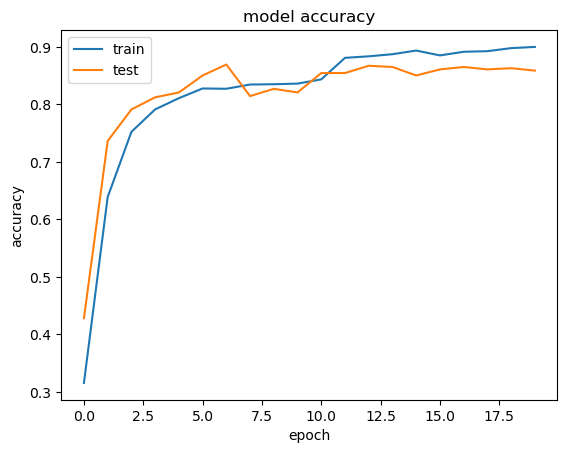

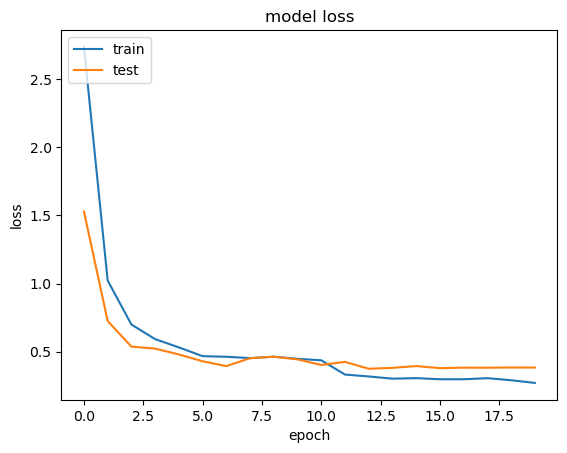

In [32]:
# list all data in history
print(history.keys())
# summarize history for accuracy
plt.plot(history['acc'])
plt.plot(history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

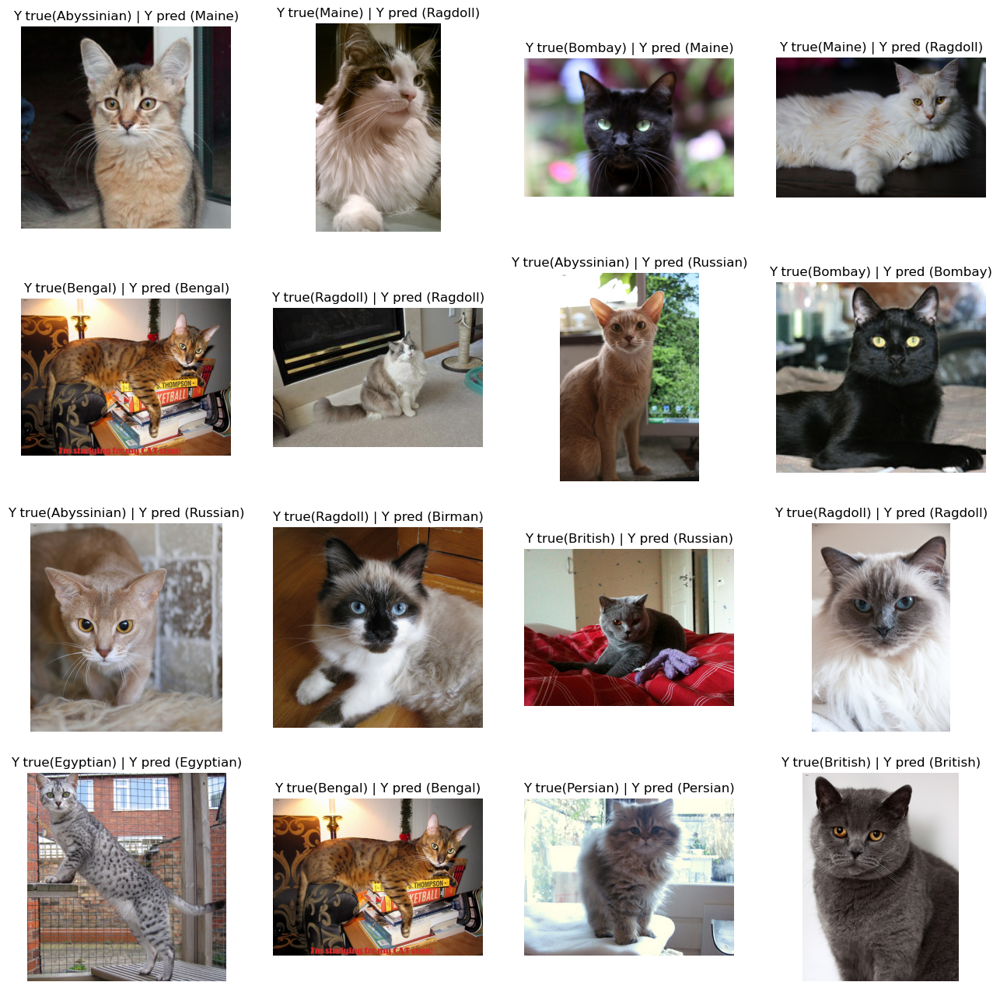

In [33]:
visualize_classifications(model_1, valid_gen_flow_cat)

In [34]:
class_names = list(valid_gen_flow_cat.class_indices.keys())

In [35]:
#Predicted label
y_pred = model_1.predict(valid_gen_flow_cat)
y_pred_label = np.argmax(y_pred,axis=1)


#true labels
y_test = valid_gen_flow_cat.classes

#classification report
class_report =  classification_report(y_test,y_pred_label,target_names=class_names,output_dict=True)
sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

4/4 [==============================] - 3s 539ms/step


ValueError: Number of classes, 11, does not match size of target_names, 12. Try specifying the labels parameter

ValueError: The number of FixedLocator locations (11), usually from a call to set_ticks, does not match the number of labels (12).

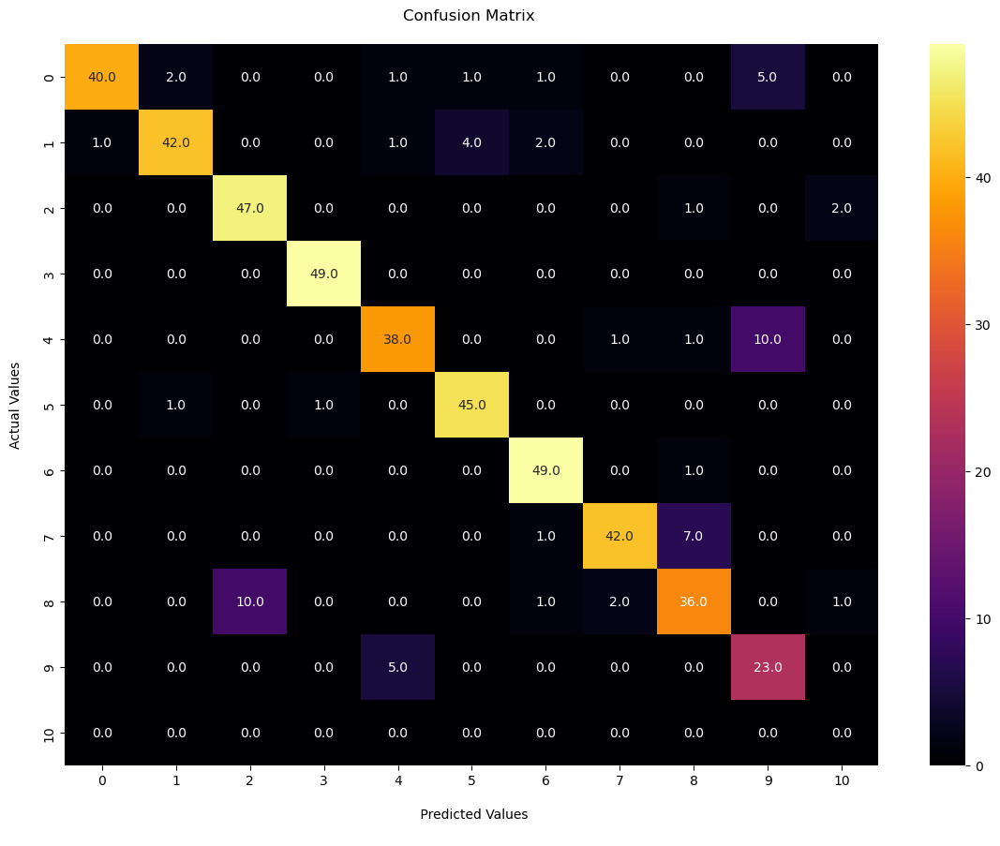

In [36]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(14,10))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".1f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(class_names)
fx.yaxis.set_ticklabels(class_names)
plt.show()

**Dog classifier**

In [37]:
pretrainedModel_dog = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE_GN,
     include_top=False,
     weights='imagenet',
     pooling='avg'
)
pretrainedModel_dog.trainable = False

inputs = pretrainedModel_dog.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrainedModel_dog.output)
x = tf.keras.layers.Dense(64, activation='relu')(x)

outputs = tf.keras.layers.Dense(23, activation='softmax')(x)

model_2 = tf.keras.Model(inputs=inputs, outputs=outputs)
model_2.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(learning_rate=0.01), metrics=['acc'])

model_2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                           

In [38]:
train_history_2 = train_model(model_2, train_gen_flow_dog, valid_gen_flow_dog, epochs = 50,name="dog")

Epoch 1/50
32/32 [==============================] - ETA: 0s - loss: 1.0216 - acc: 0.6857
Epoch 2: val_loss improved from 0.74621 to 0.48033, saving model to dog_weights.hdf5
32/32 [==============================] - 69s 2s/step - loss: 1.0216 - acc: 0.6857 - val_loss: 0.4803 - val_acc: 0.8543 - lr: 0.0100
Epoch 3/50
32/32 [==============================] - ETA: 0s - loss: 0.8628 - acc: 0.7273
Epoch 3: val_loss improved from 0.48033 to 0.47389, saving model to dog_weights.hdf5
32/32 [==============================] - 69s 2s/step - loss: 0.8628 - acc: 0.7273 - val_loss: 0.4739 - val_acc: 0.8653 - lr: 0.0100
Epoch 4/50
32/32 [==============================] - ETA: 0s - loss: 0.7713 - acc: 0.7469
Epoch 4: val_loss improved from 0.47389 to 0.46199, saving model to dog_weights.hdf5
32/32 [==============================] - 68s 2s/step - loss: 0.7713 - acc: 0.7469 - val_loss: 0.4620 - val_acc: 0.8472 - lr: 0.0100
Epoch 5/50
32/32 [==============================] - ETA: 0s - loss: 0.7236 - acc: 

In [39]:
#test data evaluation
model_2.evaluate(valid_gen_flow_dog)

8/8 [==============================] - 5s 596ms/step - loss: 0.3542 - acc: 0.8945


[0.35418900847435, 0.8944723606109619]

In [40]:
#Saving the model
tf.keras.models.save_model(model_2,"dog_model.h5")

In [41]:
#saving the history
import pickle
with open('dog_history.pkl', 'wb') as file_pi:
    pickle.dump(train_history_2.history, file_pi)

#loading the history
with open('dog_history.pkl', "rb") as file_pi:
    history = pickle.load(file_pi)

dict_keys(['loss', 'acc', 'val_loss', 'val_acc', 'lr'])


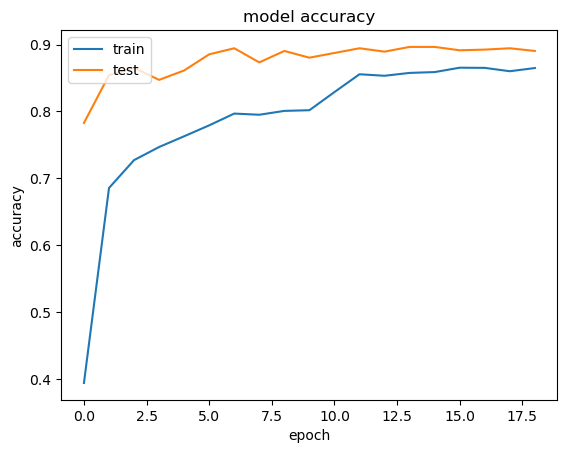

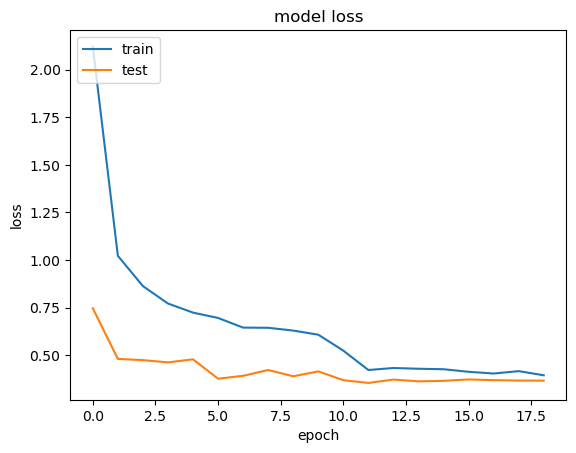

In [42]:
# list all data in history
print(history.keys())
# summarize history for accuracy
plt.plot(history['acc'])
plt.plot(history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

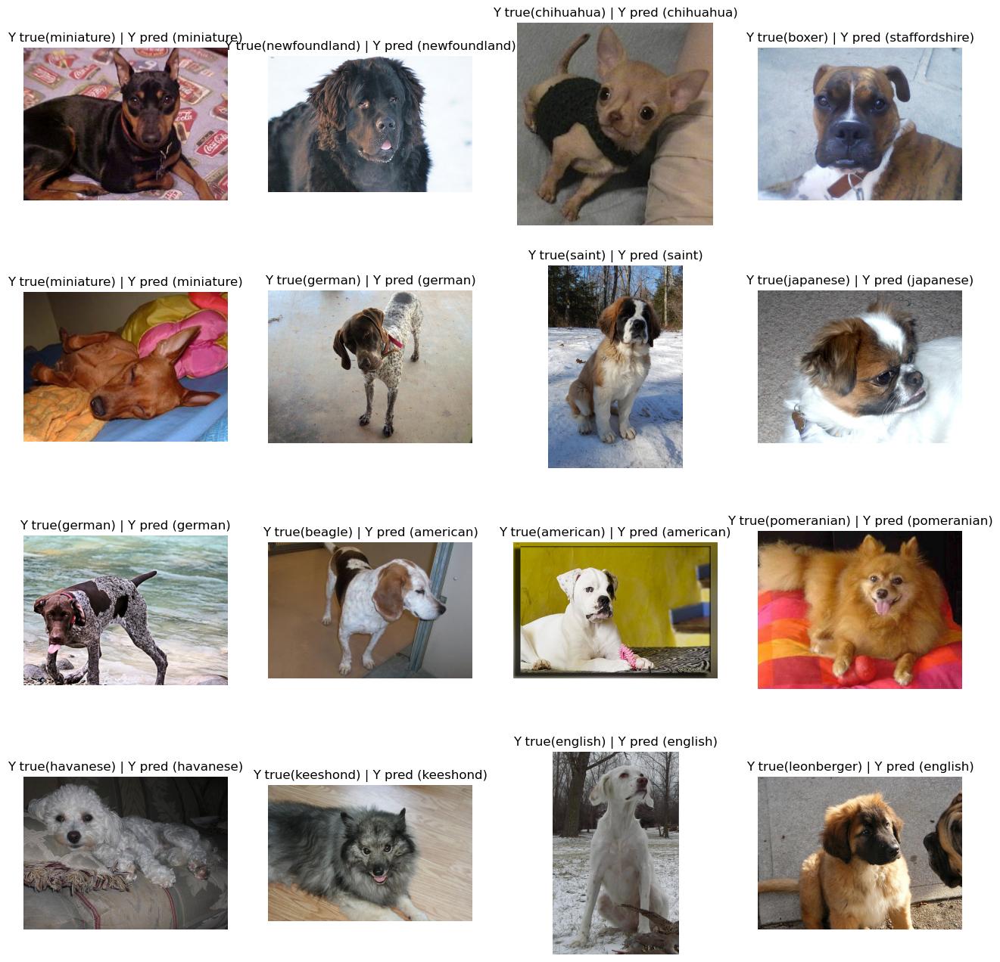

In [43]:
visualize_classifications(model_2, valid_gen_flow_dog)

In [44]:
class_names_2 = list(valid_gen_flow_dog.class_indices.keys())

In [45]:
import numpy as np

# Check the unique classes in y_test
unique_classes = np.unique(y_test)
print("Unique classes in y_test:", unique_classes)
print("Number of classes in y_test:", len(unique_classes))


Unique classes in y_test: [0 1 2 3 4 5 6 7 8 9]
Number of classes in y_test: 10


In [46]:
#Predicted label
y_pred = model_2.predict(valid_gen_flow_dog)
y_pred_label = np.argmax(y_pred,axis=1)
#y_pred_label[-1] = 19

#true labels
y_test = valid_gen_flow_dog.classes




8/8 [==============================] - 5s 588ms/step


In [47]:
y_pred_label

array([ 0, 20, 20,  0,  3, 20,  0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  3,  0,  0,  0,  0,  0,  0,  0, 15,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0, 20, 20, 20, 20,  0, 20,  0,  0, 20,  4,  0,  0,  0,  0,  0,  0,
        0, 20,  0, 20,  0,  0, 12,  0,  0,  0,  0,  0,  0, 20, 20,  0, 20,
        0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  1,  1,
        1,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,  1,  1,  1, 20,  1,
        2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  0,  2,  2,  2,  1,  2,  2,  2,  2,  2,  2,  2,  1,  2,
       19,  1,  1,  2,  2,  1,  1,  2,  2,  0,  1,  6,  2,  3,  0,  3,  3,
        3,  3,  3,  3,  3,  0,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  1,  3,  3,  3

In [48]:
class_names_2

['american',
 'basset',
 'beagle',
 'boxer',
 'chihuahua',
 'english',
 'german',
 'great',
 'havanese',
 'japanese',
 'keeshond',
 'leonberger',
 'miniature',
 'newfoundland',
 'pomeranian',
 'pug',
 'saint',
 'samoyed',
 'scottish',
 'shiba',
 'staffordshire',
 'wheaten',
 'yorkshire']

In [49]:
# Check the unique classes in y_test and y_pred_label
print(f"Unique classes in y_test: {np.unique(y_test)}")
print(f"Unique classes in y_pred_label: {np.unique(y_pred_label)}")
print(f"Number of classes in y_test: {len(np.unique(y_test))}")
print(f"Number of classes in y_pred_label: {len(np.unique(y_pred_label))}")

Unique classes in y_test: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]
Unique classes in y_pred_label: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22]
Number of classes in y_test: 18
Number of classes in y_pred_label: 22


In [50]:
# Find the difference between the predicted and true classes
extra_classes_in_pred = set(np.unique(y_pred_label)) - set(np.unique(y_test))
print("Extra classes in prediction:", extra_classes_in_pred)


Extra classes in prediction: {18, 19, 20, 22}


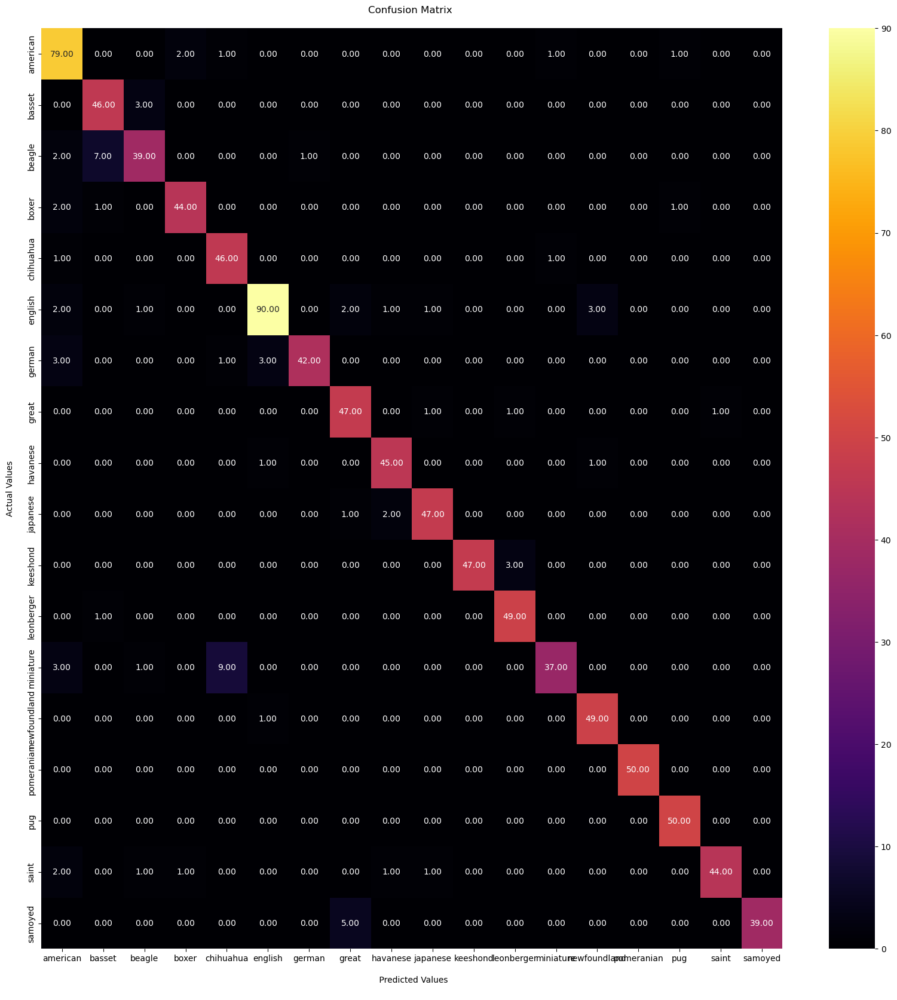

In [51]:
import numpy as np

# Ensure y_test is a numpy array
y_test = np.array(y_test)

# Filter out the extra classes (18, 19, 20, 22) from y_pred_label
valid_class_indices = np.isin(y_pred_label, list(range(18)))  # y_test has classes 0-17

# Filter both y_pred_label and y_test using valid_class_indices
y_pred_label_filtered = y_pred_label[valid_class_indices]
y_test_filtered = y_test[valid_class_indices]

# Create confusion matrix using filtered labels
conf_matrix = confusion_matrix(y_test_filtered, y_pred_label_filtered)

# Define the correct class names for the confusion matrix (18 classes in y_test)
valid_class_names = [class_names_2[i] for i in range(18)]  # 18 classes in y_test

# Plot confusion matrix
plt.figure(figsize=(20,20))
fx = sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(valid_class_names)
fx.yaxis.set_ticklabels(valid_class_names)
plt.show()


ValueError: The number of FixedLocator locations (22), usually from a call to set_ticks, does not match the number of labels (23).

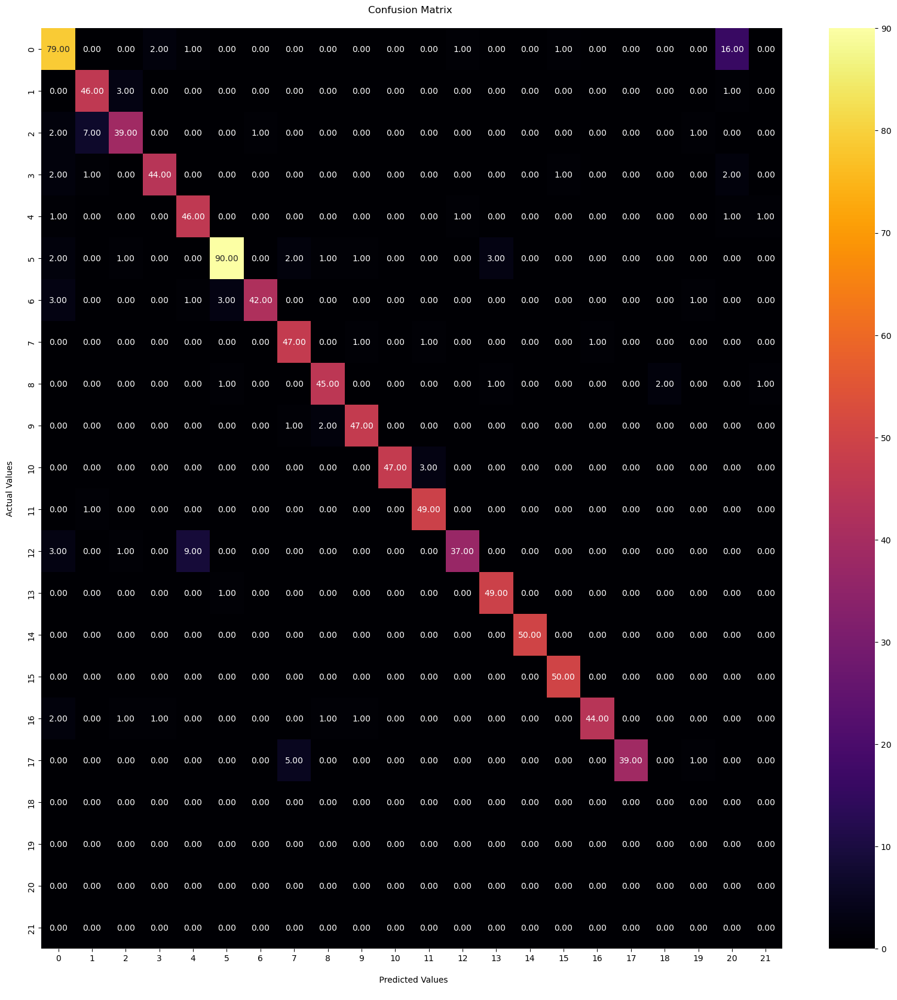

In [52]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(20,20))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".2f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(class_names_2)
fx.yaxis.set_ticklabels(class_names_2)
plt.show()